# <center>Análisis de la música de Spotify</center>

<img src="https://play-lh.googleusercontent.com/P2VMEenhpIsubG2oWbvuLGrs0GyyzLiDosGTg8bi8htRXg9Uf0eUtHiUjC28p1jgHzo" width="250px">

## Abstract

La industria de la música se está expandiendo más rápido que nunca. Este mercado se está expandiendo rápidamente y se está volviendo más competitivo. Las empresas deben diferenciarse ofreciendo contenido único centrado en el artista o inventando nuevas estrategias de precios.

Spotify, que se creó en 2006, ha crecido hasta convertirse en la red de streaming más popular del mundo. Estudiaremos las tendencias de las canciones de los cantantes utilizando los datos proporcionados por este sitio. Al igual que se estudiaran las principales características de las canciones más populares de Spotify y entender cómo se relacionan entre sí según sus características.

Aquí, exploraremos y cuantificaremos datos sobre la música y extraeremos información valiosa. Se realizara un proyecto de análisis exploratorio de datos (EDA) y visualización de datos usando datos de Spotify usando Python.

Se analizaran datos que exploran la relación entre las características de audio de una canción y cuán positivas o negativas son sus letras, lo que implica el análisis de sentimientos.

A partir de ahí, se pueden plantear estrategias para aumentar la popularidad de los cantantes, permitiéndoles ser más competitivos y exitosos en la industria musical.

## Definición de Objetivo

¿Cómo podemos distinguir las principales características de las canciones más populares de Spotify? 

¿Cómo se relacionan entre sí las canciones según sus características?

## Contexto Comercial

Spotify ha experimentado un aumento en el número de reproducciones musicales. Quieren saber como ha aumentado el número de reproducciones en los últimos años. Para las últimas 2 decadas, han recopilado detalles para cada canción y sus características y han estado manteniendo registros desde entonces (desde el año 2000 hasta el año 2020).

Spotify necesita ayuda para contruir visualizaciones que les ayuden a identificar patrones en las características de las canciones, lo que les ayudaría a tomar acciones para mejorar su sistema de recomendación de canciones a sus usuarios en el futuro. Tienen ciertos parámetros como artista, canción, duración, año, popularidad, género, etc. De los que se preocupan y de los que les gustaría obtener información específica.

## Preguntas de interés

**1. ¿Cúal fue el mayor número de cancionciones exitosas en los ultimos 20 años? y ¿Cúal fue el menor número de éxitos registrados?**

**2. ¿Quienes han sido los artistas con mayor número de éxitos en los ultimos 20 años?**

**3. ¿Quienes han sido los artistas con mayor popularidad en los ultimos 20 años?**

**4. ¿Que quiere decir que las canciones tengan mas bailabilidad o energía? y ¿Que quiere decir que un cancion exitosa tenga variación en puntajes como elocuencia, vivacidad, instrumentación y acústica?**

**5. ¿Cúal es la correlación entre las caracteristicas de una canción y que quiere decir que tengan un correlación negativa?**

**6. ¿Cuales han sido los generos más populares en los ultimos 20 años?**

**7. ¿Cuantas canciones tienen contenido explícito?, ¿El contenido explícito de una canción hace que sea más popular?**

## Contexto Analítico

Se ha proporcionado un archivo .CSV (almacenado en la carpeta datos) que contiene detalles sobre cada canción, por ejemplo, artista,
canción,
duración,
explícito,
año,
popularidad,
bailabilidad,
energía,
llave,
volumen,
modo,
habladuría,
acústica,
instrumentalidad,
vivacidad,
valencia,
tempo,
género.

Se realizaran las siguientes tareas con los datos proporcionados:

- Leer, transformar y preparar datos para su visualización.

- Realizar análisis y construir visualizaciones de los datos para identificar patrones.

### Paquetes a importar

In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode
import plotly.graph_objects as go

import sklearn
import mlxtend
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score as acc
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn import metrics
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score

In [2]:
init_notebook_mode(connected=True)

## Dataset

In [3]:
df_spotify = "https://raw.githubusercontent.com/ricss125/Analisis_de_la_Musica_de_Spotify_CoderHouse/main/Dataset/songs_normalize.csv"
df = pd.read_csv(df_spotify)
df

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066,False,1999,79,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546,False,1999,66,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493,False,2000,78,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560,False,2000,65,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,Jonas Brothers,Sucker,181026,False,2019,79,0.842,0.734,1,-5.065,0,0.0588,0.0427,0.000000,0.1060,0.952,137.958,pop
1996,Taylor Swift,Cruel Summer,178426,False,2019,78,0.552,0.702,9,-5.707,1,0.1570,0.1170,0.000021,0.1050,0.564,169.994,pop
1997,Blanco Brown,The Git Up,200593,False,2019,69,0.847,0.678,9,-8.635,1,0.1090,0.0669,0.000000,0.2740,0.811,97.984,"hip hop, country"
1998,Sam Smith,Dancing With A Stranger (with Normani),171029,False,2019,75,0.741,0.520,8,-7.513,1,0.0656,0.4500,0.000002,0.2220,0.347,102.998,pop


### Limpieza de datos

**Para empezar con la limpieza de datos seguiremos los siguinetes pasos:**
- Evaluaremos si existen datos faltantes dentro de nuestro dataset.
- Contar los valores faltantes por cada columna.
- Observar si hay datos duplicados para removerlos.
- Revisar que el tipo de datos sea correcto. En dado caso de que no haya algún tipo de dato correcto corregirlo.
- Por último se evaluara si hay "outliers". Para encontrar los "outliers" se usara el metodo del rango intercuartílico (IQR) y seguido se creara un "boxplot" para poder visualizar los "outliers".

In [4]:
df.isnull().sum()

artist              0
song                0
duration_ms         0
explicit            0
year                0
popularity          0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
genre               0
dtype: int64

In [5]:
#Para detectar si hay datos faltantes podemos hacer lo siguiente:
missing_data = df.isnull()
missing_data.head(5)

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


"True" Quiere decir que faltan datos y "False" quiere decir que no faltan datos

**Ahora vamos a contar los valores faltantes por cada columna**

In [6]:
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("")

artist
False    2000
Name: artist, dtype: int64

song
False    2000
Name: song, dtype: int64

duration_ms
False    2000
Name: duration_ms, dtype: int64

explicit
False    2000
Name: explicit, dtype: int64

year
False    2000
Name: year, dtype: int64

popularity
False    2000
Name: popularity, dtype: int64

danceability
False    2000
Name: danceability, dtype: int64

energy
False    2000
Name: energy, dtype: int64

key
False    2000
Name: key, dtype: int64

loudness
False    2000
Name: loudness, dtype: int64

mode
False    2000
Name: mode, dtype: int64

speechiness
False    2000
Name: speechiness, dtype: int64

acousticness
False    2000
Name: acousticness, dtype: int64

instrumentalness
False    2000
Name: instrumentalness, dtype: int64

liveness
False    2000
Name: liveness, dtype: int64

valence
False    2000
Name: valence, dtype: int64

tempo
False    2000
Name: tempo, dtype: int64

genre
False    2000
Name: genre, dtype: int64



Basandonos en el resumen de arriba, Cada columna tiene 2000 filas y podemos observar que ninguna columna tiene datos faltantes

**Ahora vamos a buscar si hay datos duplicados**

In [7]:
df.duplicated().value_counts()

False    1941
True       59
dtype: int64

De acuerdo al resultado mostrado podemos observar que hay 59 datos duplicados dentro de nuestro dataset. Por lo que a continuación eliminaremos esos datos duplicados para obtener mejores resultados

In [8]:
df.drop_duplicates(inplace=True)

In [9]:
df.shape

(1941, 18)

Se puede observar que los datos duplicados se eliminaron y ahora nos quedamos con 18 columnas y 1941 filas

**Ahora vamos a checar que los tipos de datos esten correctos**

In [10]:
df.dtypes

artist               object
song                 object
duration_ms           int64
explicit               bool
year                  int64
popularity            int64
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
genre                object
dtype: object

Podemos observar que todas las columnas tienen el tipo de dato correcto. Las variables numericas son de tipo flotante o enteros
y las variables de texto o categoria son de tipo objeto y la unica variable de tipo boleano es para saber si la canción es explicita o no

In [11]:
df.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop
1,blink-182,All The Small Things,167066,False,1999,79,0.434,0.897,0,-4.918,1,0.0488,0.0103,0.000000,0.6120,0.684,148.726,"rock, pop"
2,Faith Hill,Breathe,250546,False,1999,66,0.529,0.496,7,-9.007,1,0.0290,0.1730,0.000000,0.2510,0.278,136.859,"pop, country"
3,Bon Jovi,It's My Life,224493,False,2000,78,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal"
4,*NSYNC,Bye Bye Bye,200560,False,2000,65,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop


In [12]:
df.describe()

,duration_ms,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
count,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000,1941.000000
mean,228594.973725,2009.520350,59.633179,0.667814,0.721549,5.369397,-5.514082,0.553323,0.103783,0.128173,0.015372,0.181726,0.552966,120.158442
std,39249.796103,5.875532,21.501053,0.140608,0.152872,3.615270,1.938950,0.497277,0.096148,0.172584,0.088371,0.140910,0.220845,26.990475
min,113000.000000,1998.000000,0.000000,0.129000,0.054900,0.000000,-20.514000,0.000000,0.023200,0.000019,0.000000,0.021500,0.038100,60.019000
25%,203506.000000,2004.000000,56.000000,0.581000,0.624000,2.000000,-6.490000,0.000000,0.039700,0.013500,0.000000,0.088400,0.390000,98.986000
50%,223186.000000,2010.000000,65.000000,0.676000,0.739000,6.000000,-5.285000,1.000000,0.061000,0.055800,0.000000,0.124000,0.560000,120.028000
75%,247946.000000,2015.000000,73.000000,0.765000,0.840000,8.000000,-4.168000,1.000000,0.129000,0.176000,0.000069,0.242000,0.731000,134.199000
max,484146.000000,2020.000000,89.000000,0.975000,0.999000,11.000000,-0.276000,1.000000,0.576000,0.976000,0.985000,0.853000,0.973000,210.851000


**Por ultimo vamos a buscar algunos outliers**

Una forma de identificar valores atípicos o "Outliers" es mediante el método del rango intercuartílico (IQR). El IQR es el rango entre el percentil 75 (Q3) y el percentil 25 (Q1) de los datos. Los puntos de datos que se encuentren por debajo de Q1 - 1,5 x IQR o por encima de Q3 + 1,5 x IQR pueden considerarse como valores atípicos potenciales.

In [13]:
Q1 = df['popularity'].quantile(0.25)
Q3 = df['popularity'].quantile(0.75)
IQR = Q3 - Q1

# Calcular los límites inferior y superior para posibles valores atípicos.
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identifica valores atípicos potenciales en la columna de popularidad.
outliers = df[(df['popularity'] < lower_bound) | (df['popularity'] > upper_bound)]
print(outliers)

                   artist                                               song  \
10        Gigi D'Agostino                                   L'Amour Toujours   
59                  Oasis                                      Go Let It Out   
62           Mariah Carey  Against All Odds (Take A Look at Me Now) (feat...   
105         Nelly Furtado                                    I'm Like A Bird   
126        Jennifer Lopez                                     Ain't It Funny   
...                   ...                                                ...   
1961              Ava Max                                            So Am I   
1966             Blueface                                           Thotiana   
1973  5 Seconds of Summer                                             Easier   
1986                 Lauv                                    i'm so tired...   
1994          Post Malone                        Goodbyes (Feat. Young Thug)   

      duration_ms  explicit  year  popu

Una forma de visualizar los valores atípicos es crear un diagrama de caja (box plot), el cual muestra la distribución de los datos y destaca cualquier valor atípico que se encuentre fuera de los bigotes (whiskers).

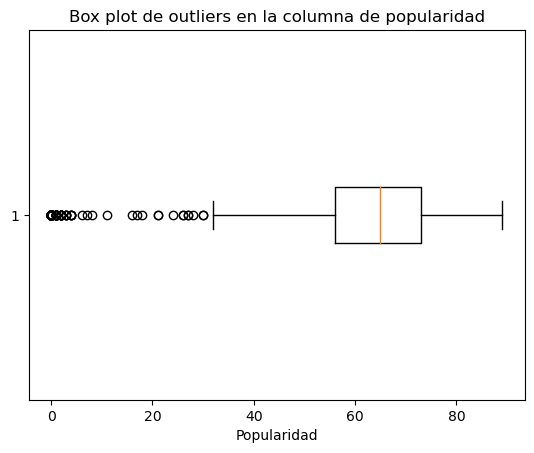

In [14]:
plt.boxplot(df['popularity'], vert=False)
plt.title('Box plot de outliers en la columna de popularidad')
plt.xlabel('Popularidad')
plt.show()

Aquí hay algunos patrones potenciales que pueden surgir al analizar los valores atípicos:

- Los valores atípicos pueden estar dominados por ciertos géneros de música o tipos de artistas. Por ejemplo, puede ser más común ver valores atípicos en la columna de popularidad para canciones de los géneros pop o hip-hop, o para canciones de artistas establecidos o conocidos.

- Los valores atípicos en la columna de popularidad también pueden estar asociados con ciertos factores fuera de la música en sí, como los esfuerzos de promoción o marketing. Las canciones que son ampliamente promocionadas o comercializadas pueden ser más propensas a volverse populares, independientemente de sus cualidades musicales.

# <center> Visualizaciones

### <center>Vamos a ver algunas visualizaciones para representar nuestros datos ya limpios

#### <center>Vamos a empezar por el número de canciones por año

In [15]:
songs_by_year = df.groupby("year").size().to_frame(name = 'songs').reset_index()
songs_by_year

,year,songs
0,1998,1
1,1999,38
2,2000,71
3,2001,106
4,2002,86
5,2003,91
6,2004,95
7,2005,101
8,2006,93
9,2007,90


Como podemos ver arriba, los datos tienen:

**1** canción de **1998**;

**38** canciones de **1999**;

**3** canciones de **2020**.

Al calcular el promedio de canciones por año, la cantidad de canciones lanzadas en 1998, 1999 y 2020 está muy por debajo. Entonces, considerando la dimensión de esas cantidades, descartaremos esas observaciones.

In [16]:
# Descartar las observaciones de 1998, 1999 y 2020
df = df[(df.year >= 2000) & (df.year <= 2019)]

# Checar que el año este en el rango correcto
top_songs = df.groupby("year")["song"].count()
top_songs

year
2000     71
2001    106
2002     86
2003     91
2004     95
2005    101
2006     93
2007     90
2008     91
2009     82
2010    103
2011     96
2012    113
2013     87
2014    100
2015     93
2016     98
2017    110
2018    104
2019     89
Name: song, dtype: int64

In [17]:
df = df[(df.year >= 2000) & (df.year <= 2019)]

total_songs = df["song"].count()

print("Número total de canciones entre 2000 y 2019:", total_songs)

Número total de canciones entre 2000 y 2019: 1899


In [18]:
#Haremos un grafico de velocimetro para mostrar el KPI
fig = go.Figure(go.Indicator(
    mode = "gauge+number",
    value = total_songs,
    title = {'text': "Número total de canciones entre 2000 y 2019"},
    gauge = {
        'axis': {'range': [None, 2100]}}))

fig.show()

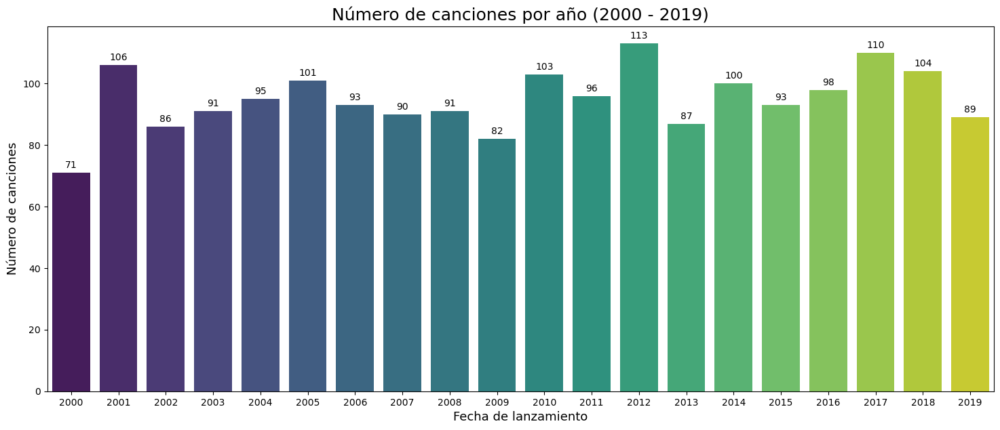

In [19]:
#Graficamos nuestros datos
songs_by_year = df.groupby("year").size().to_frame(name = 'songs').reset_index()
plt.figure(figsize = (18,7))
plots = sns.barplot(x = 'year', y = 'songs', data = songs_by_year, palette = 'viridis')
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.0f'),
                (bar.get_x() + bar.get_width() / 2,
                bar.get_height()), ha='center', va='center',
                size=10, xytext=(0, 8),
                textcoords='offset points')
    
plt.xlabel('Fecha de lanzamiento', size = 13)
plt.ylabel('Número de canciones', size = 13)
plt.title("Número de canciones por año (2000 - 2019)", size = 18)
plt.show()

Podemos concluir que, de 2000 a 2019:

El mayor número de canciones exitosas se registró en el año de:

- 2012 (115 éxitos principales);

- 2017 (111 éxitos principales);

- 2001 (108 éxitos principales).

Por otro lado, el menor número de éxitos se registró en el año de:

- 2000 (74 éxitos principales);

- 2009 (84 éxitos principales);

- 2013 y 2019 (89 éxitos principales cada uno)

#### <center>Ahora veremos los top 25 artistas con el mayor número de exitos

In [20]:
artists = df['artist'].value_counts().head(25)
artists

Rihanna              23
Drake                23
Eminem               21
Calvin Harris        20
Britney Spears       18
David Guetta         18
Katy Perry           16
Beyoncé              16
Chris Brown          16
Taylor Swift         16
Kanye West           16
P!nk                 14
Black Eyed Peas      14
Maroon 5             13
Ariana Grande        13
Jason Derulo         11
Bruno Mars           11
Usher                11
Nelly                11
Coldplay             11
Justin Timberlake    11
JAY-Z                11
Lady Gaga            10
Avril Lavigne        10
Avicii               10
Name: artist, dtype: int64

In [21]:
x = artists.index
y = artists

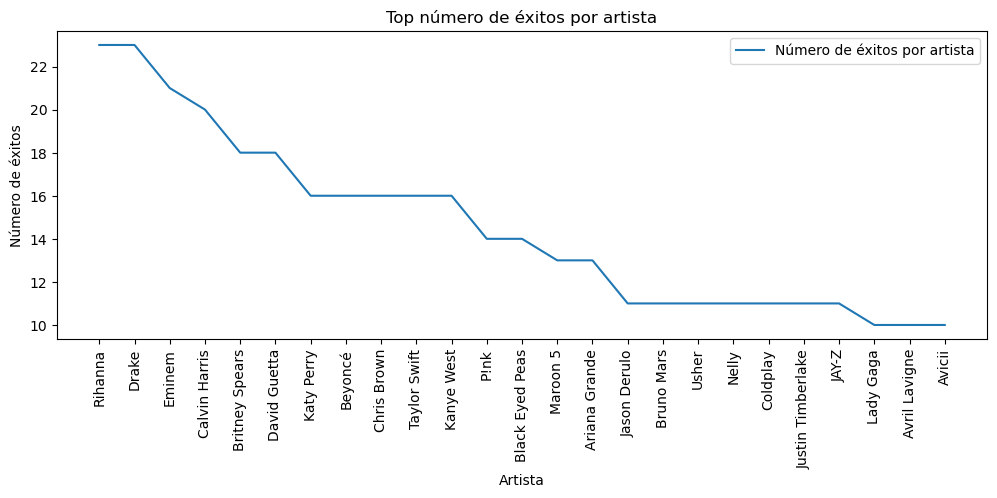

In [22]:
fig, ax = plt.subplots(figsize=(12, 4))
ax.plot(x, y, label='Número de éxitos por artista')
ax.set_xlabel('Artista')                  
ax.set_ylabel('Número de éxitos')
ax.set_title('Top número de éxitos por artista')
plt.xticks(rotation=90)
ax.legend() 

**Para verlo de manera más detallada se presenta la siguiente visualización**

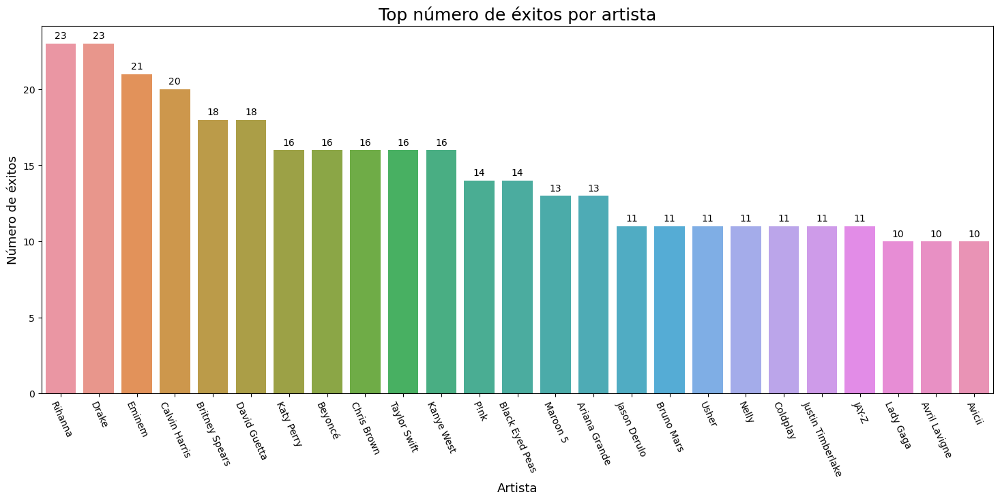

In [23]:
plt.figure(figsize = (18,7))
plots = sns.barplot(x = artists.index, y=artists, data = songs_by_year)
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.0f'),
                (bar.get_x() + bar.get_width() / 2,
                bar.get_height()), ha='center', va='center',
                size=10, xytext=(0, 8),
                textcoords='offset points')
plt.xticks(rotation=295)
plt.xlabel('Artista', size = 13)
plt.ylabel('Número de éxitos', size = 13)
plt.title("Top número de éxitos por artista", size = 18)
plt.show()

Se puede observar que:

**Rihanna**

**Drake**

**Eminem**

Son los artistas con mayor número de exitos 

Drake y Rihanna tienen la mayor cantidad de canciones que han sido hit o en las listas de éxitos, pero ¿son los artistas más populares? ¡Vamos a ver!

#### <center>Ahora veremos los top 10 artistas más populares

In [24]:
#pop_artist = df[['artist','popularity']]
pop_artist = df.groupby('artist',as_index=False).sum().sort_values('popularity',ascending = False).head(10)
pop_artist.index = pop_artist['artist']
pop_artist

C:\Users\Dell\AppData\Local\Temp\ipykernel_40100\2103474142.py:2: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



,artist,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
artist,,,,,,,,,,,,,,,,
Rihanna,Rihanna,5408899,8,46226,1662,15.055,15.292,120,-129.832,12,1.8910,3.556065,0.152080,3.5212,11.9110,2900.072
Eminem,Eminem,5939050,20,42123,1519,15.603,16.374,113,-83.568,9,4.6724,2.212270,0.001437,4.0052,11.4526,2360.762
Drake,Drake,5337202,18,46334,1424,16.859,13.767,120,-164.954,15,3.7478,1.995427,0.100460,3.8368,10.3514,2812.323
Calvin Harris,Calvin Harris,4546171,1,40269,1356,13.719,17.429,118,-77.276,6,1.1381,1.559682,1.041232,4.3994,12.3440,2502.882
David Guetta,David Guetta,3614825,2,36230,1185,11.089,14.444,121,-69.850,8,1.3803,1.622460,0.176915,4.0110,9.3570,2215.655
Britney Spears,Britney Spears,3906168,1,36096,1140,12.824,13.276,102,-99.761,9,1.3332,4.336690,0.027574,2.8040,12.2340,2078.556
Taylor Swift,Taylor Swift,3575968,0,32214,1125,10.105,11.222,95,-94.796,12,1.2955,1.158330,0.012130,2.1732,8.0110,2033.322
Katy Perry,Katy Perry,3524211,0,32185,1033,10.233,12.462,79,-73.576,11,0.8995,0.373918,0.000055,3.4892,9.9920,2095.581
Beyoncé,Beyoncé,3805221,2,32126,1030,10.257,10.480,80,-97.401,10,2.3831,1.346470,0.001373,2.6223,8.3890,1903.492


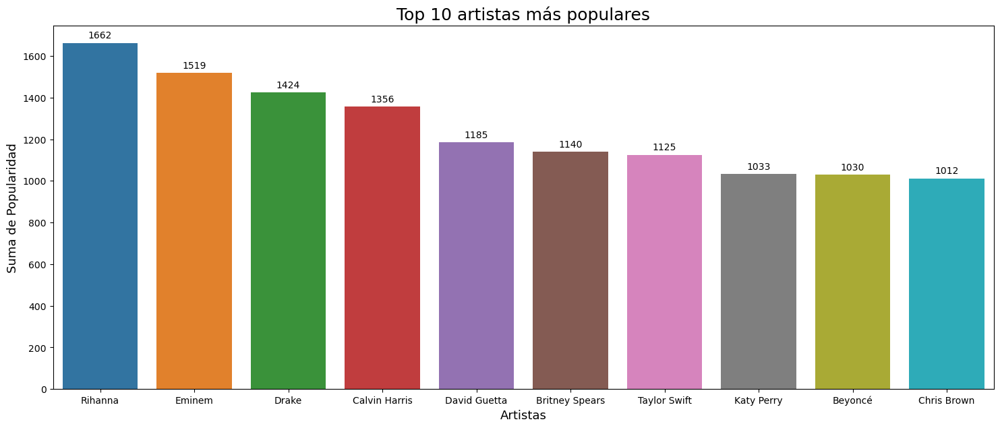

In [25]:
plt.figure(figsize = (18,7))
plots = sns.barplot(x = "artist", y="popularity", data = pop_artist)
for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.0f'),
                (bar.get_x() + bar.get_width() / 2,
                bar.get_height()), ha='center', va='center',
                size=10, xytext=(0, 8),
                textcoords='offset points')
plt.xlabel('Artistas', size = 13)
plt.ylabel('Suma de Popularidad', size = 13)
plt.title("Top 10 artistas más populares", size = 18)
plt.show()

Los artistas con una **suma** más alta en popularidad son **Rihanna** y **Eminem**

#### <center>Ahora veremos algunas caracteristicas interesantes del audio

Incluso antes de mirar los datos, creo que las características del audio pueden ser una de las buenas razones por las que las 10 mejores canciones están en la lista de las mejores de Spotify.

Las características son:

- Bailabilidad

- energía

- acústica

- ruidosidad

- habladuría

- vivacidad

In [26]:
fig=make_subplots(rows=3,cols=3,subplot_titles=('<i>Popularidad', '<i>bailabilidad', '<i>Energía', '<i>Ruidosidad', 
                                                '<i>Habladuría', '<i>Acústica', '<i>Vivacidad', '<i>Valencia', '<i>Tempo'))
fig.add_trace(go.Histogram(x=df['popularity'],name='Popularidad'),row=1,col=1)
fig.add_trace(go.Histogram(x=df['danceability'],name='Bailabilidad'),row=1,col=2)
fig.add_trace(go.Histogram(x=df['energy'],name='Energía'),row=1,col=3)
fig.add_trace(go.Histogram(x=df['loudness'],name='Ruidosidad'),row=2,col=1)
fig.add_trace(go.Histogram(x=df['speechiness'],name='Habladuría'),row=2,col=2)
fig.add_trace(go.Histogram(x=df['acousticness'],name='Acústica'),row=2,col=3)
fig.add_trace(go.Histogram(x=df['liveness'],name='Vivacidad'),row=3,col=1)
fig.add_trace(go.Histogram(x=df['valence'],name='Valencia'),row=3,col=2)
fig.add_trace(go.Histogram(x=df['tempo'],name='Tempo'),row=3,col=3)
fig.update_layout(height=900,width=900,title_text='<b>Distribución de caracteristicas')
fig.update_layout(template='plotly_dark',title_x=0.5)
fig.show("notebook")

Se hizo un análisis de todas las características anteriores y, de hecho, estas características dicen mucho sobre las canciones: 

- Algunas de las canciones tienden a tener un puntaje alto en la capacidad de baile o la energía, lo que dice que estas canciones se pueden tocar en el club, pub, fiestas y es bueno bailar.

- Algunas canciones tienen un tempo promedio de 120.08 BPM, lo que indica que estas canciones tienen un ritmo de normal a rápido.

- La mayoría de las canciones exitosas obtuvieron puntajes bajos en elocuencia, vivacidad, instrumentación y acústica, ya que estas pistas contienen muchas letras, voces que se pueden cantar en las bodas, en el karaoke junto a la playa, etc. En otras palabras, canciones relajantes que uno puede relajarse.

- La media de valencia es de 0.55, considerando que la valencia es una medida de 0.0 a 1.0, donde cuanto más cerca de 1.0 más positivas son las sensaciones que transmite el track.

#### <center>Ahora veremos algunas correlaciones entre medidias

C:\Users\Dell\AppData\Local\Temp\ipykernel_40100\946457557.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



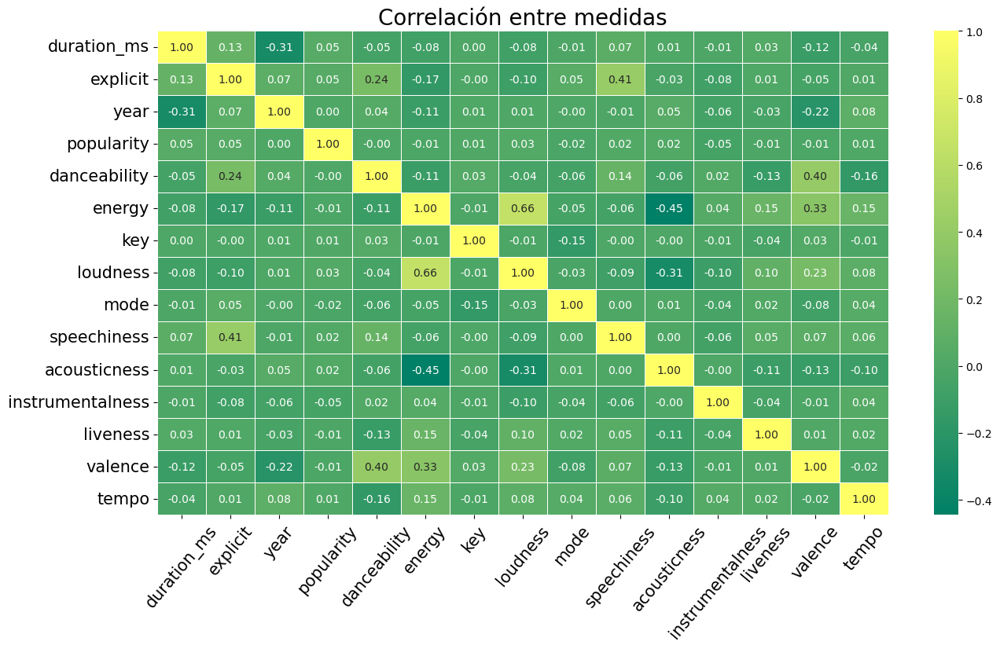

In [27]:
plt.figure(figsize=(15,8))
sns.heatmap(df.corr(), annot = True, linewidths = .5, fmt = '.2f', cmap = "summer")
plt.title('Correlación entre medidas', size = 20)
plt.yticks(fontsize=15)
plt.xticks(fontsize=15, rotation = 50)
plt.show()

Mirando el mapa de calor, podemos señalar algunas correlaciones positivas entre las medidas:

- Existe una correlación positiva entre la energía y el volumen (loudness), lo cual tiene sentido ya que las canciones más fuertes tienden a ser más enérgicas.

Algunas ototros valores que podemos observar del mapa de calor son las siguientes:

- Hay un valor negativo observable entre energy y accusticness. Es decir, cuando una sube la otra baja. Mientras más acustica la canción, menos energía tiene.

- Una valencia más alta conduce a una gran capacidad de baile ya que, en general, las personas son más felices cuando bailan.

- Lo explícito y lo verbal van de la mano, ya que más palabras significan letras más inapropiadas u ofensivas para los niños.

#### <center> A continuación veremos el top 10 de generos más populares

In [28]:
# Top 10
df.genre.value_counts().head(10)

pop                               404
hip hop, pop                      265
hip hop, pop, R&B                 232
pop, Dance/Electronic             214
pop, R&B                          167
hip hop                           118
hip hop, pop, Dance/Electronic     75
rock                               56
Dance/Electronic                   40
rock, pop                          37
Name: genre, dtype: int64

In [29]:
fig=px.histogram(df.groupby('genre',as_index=False).sum().sort_values(by='popularity',ascending=False).head(10),
                 x='genre',y='popularity',labels={'popularity':'Popularidad', 'genre':'Generos'},
                 color_discrete_sequence=['lightgreen'],template='plotly_dark',
                 marginal='box',title='<b>Top 10 generos más populares</b>')
fig.update_layout(title_x=0.5)
fig.show("notebook")

C:\Users\Dell\AppData\Local\Temp\ipykernel_40100\2867346162.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



La mayoría de las canciones a lo largo de este período son canciones pop. Y también vemos que la moda de las canciones pop y las canciones de hip hop ha aumentado con el tiempo. Anteriormente pudimos ver canciones de género variado como country, folk, etc.

Ademas de que el pop es el genero más popular esto debido a que se puede ocupar para casi cualquier ocasión y es el que más escuchan las nuevas generaciones.

Según los músicos, la música pop es intrínsecamente popular porque crea una sensación de familiaridad para los oyentes. Por lo tanto, cuando escuchan el mismo 'tono' en todo el género, se inclinan más por una pieza musical que nunca han escuchado porque les suena familiar.

#### <center>Canciones con contenido explicito

In [30]:
#Cantidad de canciones con contenido explicito y sin contenido explicito
explicit_or_not_explicit = pd.DataFrame(df.explicit.value_counts().rename_axis(
    'explicit').reset_index(name='songs'))
explicit_or_not_explicit

,explicit,songs
0,False,1373
1,True,526


In [31]:
explicit_songs = df.groupby('explicit',as_index=False).count().sort_values(by='song',ascending=False)
explicit_songs.index = explicit_songs['explicit']
explicit_songs

,explicit,artist,song,duration_ms,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
explicit,,,,,,,,,,,,,,,,,,
False,False,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373,1373
True,True,526,526,526,526,526,526,526,526,526,526,526,526,526,526,526,526,526


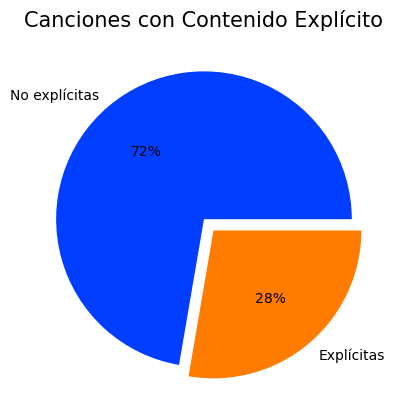

In [32]:
palette_color = sns.color_palette('bright')
explode = [0, 0.1]
plt.pie(explicit_songs.song, labels=['No explícitas','Explícitas'], colors = palette_color, autopct='%0.0f%%',explode = explode)
plt.title('Canciones con Contenido Explícito',size=15)
plt.show()

Se puede observar que la mayoria de las canciones no tiene contenido explicito o que las letras de las canciones no resulten ofensivas.

Ahora veremos como ha ido variando el contenido explicito a lo largo de los años.

In [33]:
fig=px.area(df[df['explicit']==True].groupby('year',as_index=False).count().sort_values(by='song',ascending=False).sort_values(by='year'),
            x='year',y='song',labels={'song':'Número de Canciones','year':'Año'},
            markers=True,color_discrete_sequence=['purple'],template='plotly_dark',
            title='<b>Canciones con contenido explícito durante los años')
fig.update_layout(hovermode='x',title_x=0.5)
fig.show("notebook")

Se puede observar que del año 2000 al 2004 hubo un incremento en las canciones con lenguaje ofensivo y que de 2005 a 2014 el número de canciones con letras ofensivas se mantuvo casi constante. De igual manera podemos notar que a partir del año 2015 al 2018 hubo un gran aumento en las canciones con contenido explícito esto puede deberse a que durante esos años hubo muchas polemicas alrededor del mundo al igual que muchas protestas en cuento a temas politicos en algunos paises.

Támbien esto puede deberse a que en 2016 Donald Trump gano la presidencia y durante su gobierno genero muchas polemicas y hubo mucha discriminación y racismo.

Ahora veremos un boxplot con los contenidos explicitos y no explicitos

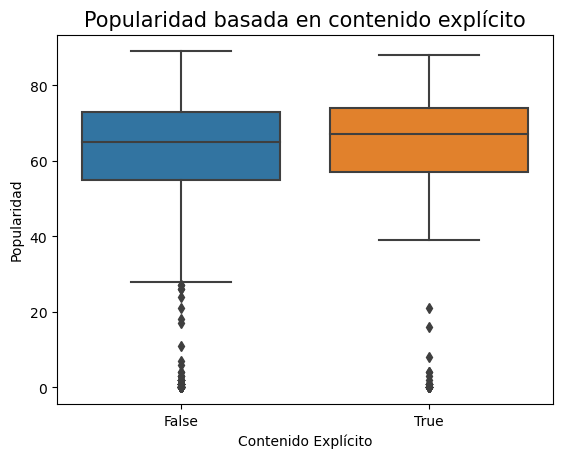

In [34]:
plots = sns.boxplot(y = df["popularity"], x = df["explicit"])
plt.xlabel("Contenido Explícito")
plt.ylabel("Popularidad")
plt.title("Popularidad basada en contenido explícito", size = 15)
plt.show()

Se puede concluir que casi el 28% de las canciones contienen contenido explícito y, al llegar a una cierta popularidad, las canciones con contenido explícito tienen una popularidad media alta. Esto puede ser debido a que lo explícito y lo verbal van de la mano, ya que más palabras significan letras más inapropiadas u ofensivas para los niños.

# <center> Insights Adicionales

**Insights que se pueden observar a partir del análisis hecho:** 

- Rihanna es la mejor artista a lo largo del 2000 al 2019 con 23 éxitos.


- El pop es el tipo de género más popular con una suma de casi 24 mil de  puntos de popularidad desde el 2000 al 2019.


- Mientras menos sea el contenido explícito más las posibilidades de que esa canción se convierta en un gran éxito.


- Algunas características como la popularidad y la acústica y la popularidad y la habladuría muestran que a la gente les gusta la música sutil y también les gustan las canciones de rap. El volumen y la energía también se correlacionan positivamente entre sí. Cuanto más fuerte es la canción, más energía tiene.


- Algunas otras características como el volumen y la acústica y la energía y la acústica. La valencia y el año y la valencia y la popularidad y la duración también tienen valores negativos. Esto muestra que las canciones que mostraban un estado de ánimo triste ganaron más popularidad a lo largo de los años.

# <center> Recomendaciones

**Se pueden igualmente hacer algunas recomendaciones a partir de las observaciones que hicimos durante el análisis:**

- Como vimos, los 10 artistas más populares tienen una influencia significativa en la popularidad de sus canciones. Colaborar con artistas populares podría aumentar las posibilidades de crear canciones populares y exitosas.


- La mayoría de las canciones en el conjunto de datos tenían un nivel de baile moderado y una energía relativamente alta. Por lo tanto, se recomienda centrarse en estas dos características para crear canciones que atraigan a una audiencia más amplia.


- La mayoría de las canciones en el conjunto de datos eran ruidosas, lo que indica que es una característica importante para crear canciones populares. Sin embargo, también es esencial asegurarse de que el volumen no afecte negativamente la calidad del sonido.


- La popularidad de una canción es un factor esencial en su éxito. Por lo tanto, se recomienda considerar el puntaje de popularidad al seleccionar canciones para listas de reproducción o fines promocionales.

# <center> Encoding

Podemos considerar codificar las variables "key" y "mode", las cuales son características categóricas.

In [35]:
#Seleccionamos las variables categoricas para el encoding
cat_vars = ['key', 'mode']

# empezaremos el proceso de one-hot enconding usando la función get_dummies de pandas
df_encoded = pd.get_dummies(df, columns=cat_vars)

#observamos nuesro resultado
df_encoded.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,loudness,speechiness,...,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,mode_0,mode_1
0,Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,-5.444,0.0437,...,0,0,0,0,0,0,0,0,1,0
3,Bon Jovi,It's My Life,224493,False,2000,78,0.551,0.913,-4.063,0.0466,...,0,0,0,0,0,0,0,0,1,0
4,*NSYNC,Bye Bye Bye,200560,False,2000,65,0.614,0.928,-4.806,0.0516,...,0,0,0,0,1,0,0,0,1,0
6,Eminem,The Real Slim Shady,284200,True,2000,86,0.949,0.661,-4.244,0.0572,...,0,1,0,0,0,0,0,0,1,0
7,Robbie Williams,Rock DJ,258560,False,2000,68,0.708,0.772,-4.264,0.0322,...,0,0,0,1,0,0,0,0,0,1


El resultado impreso muestra el conjunto de datos codificado, donde cada categoría única en las columnas "key" y "mode" se transforma en una columna binaria separada. La presencia de una categoría se representa con un 1, mientras que la ausencia se representa con un 0. Esto permite que los algoritmos de aprendizaje automático procesen las variables categóricas como características numéricas.

# <center> Feature Engineering

La ingeniería de características implica crear nuevas características o transformar características existentes para mejorar el rendimiento de un modelo de aprendizaje automático.

In [36]:
# crearemos un nuevo feature: "energy_danceability_ratio"
df['energy_danceability_ratio'] = df['energy'] / df['danceability']

#Vamos a usar "feature scaling" en nuestro nuevo feature
scaler = MinMaxScaler()
df['energy_danceability_ratio'] = scaler.fit_transform(df[['energy_danceability_ratio']])

#Creamos un nuevo feature: "loudness_squared"
df['loudness_squared'] = df['loudness'] ** 2

# Dataset actualizado con los nuevos features
df.head()

,artist,song,duration_ms,explicit,year,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre,energy_danceability_ratio,loudness_squared
0,Britney Spears,Oops!...I Did It Again,211160,False,2000,77,0.751,0.834,1,-5.444,0,0.0437,0.3000,0.000018,0.3550,0.894,95.053,pop,0.203186,29.637136
3,Bon Jovi,It's My Life,224493,False,2000,78,0.551,0.913,0,-4.063,0,0.0466,0.0263,0.000013,0.3470,0.544,119.992,"rock, metal",0.312469,16.507969
4,*NSYNC,Bye Bye Bye,200560,False,2000,65,0.614,0.928,8,-4.806,0,0.0516,0.0408,0.001040,0.0845,0.879,172.656,pop,0.283354,23.097636
6,Eminem,The Real Slim Shady,284200,True,2000,86,0.949,0.661,5,-4.244,0,0.0572,0.0302,0.000000,0.0454,0.760,104.504,hip hop,0.120395,18.011536
7,Robbie Williams,Rock DJ,258560,False,2000,68,0.708,0.772,7,-4.264,1,0.0322,0.0267,0.000000,0.4670,0.861,103.035,"pop, rock",0.199162,18.181696


La columna "energy_danceability_ratio" es una característica recién creada que cuantifica la relación entre la energía y la capacidad de baile de cada canción. Se calcula dividiendo el valor de "energy" por el valor de "danceability". Los valores resultantes representan la proporción de energía a capacidad de baile para cada canción. Esta característica proporciona información sobre qué tan enérgica es una canción en relación con su capacidad de baile.


La columna "loudness_squared" es otra característica recién creada que captura el efecto cuadrático del atributo de sonoridad. Se calcula mediante el cuadrado de los valores de la columna "loudness". El elevar al cuadrado los valores de sonoridad puede capturar relaciones no lineales y revelar patrones que no serían evidentes solo con los valores de sonoridad sin procesar.


Al agregar estas características generadas al conjunto de datos, se aumentan los datos originales con información adicional que puede ser útil para el análisis o la modelización predictiva. Estas características brindan perspectivas alternativas y posibles relaciones no lineales que podrían mejorar la comprensión de las canciones en el dataset.

# <center> Entrenando modelos de ML

## Regresión Lineal

Vamos a entrenar un modelo de regresión Lineal para predecir la popularidad de las canciones en el dataset de Spotify.

In [37]:
# Seleccionar características relevantes y variable objetivo.
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'loudness', 'speechiness', 'tempo', 'valence']
target = 'popularity'

# Dividir el conjunto de datos en subconjuntos de entrenamiento y prueba.
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Crear y entrenar el modelo de regresión.
model = LinearRegression()
model.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba.
y_pred = model.predict(X_test)

# Evaluar el modelo utilizando el error cuadrático medio (mean squared error)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 403.6031324318506


La métrica de evaluación utilizada en este ejemplo es el error cuadrático medio (MSE, por sus siglas en inglés). El valor de MSE calculado proporciona una estimación de la diferencia cuadrada promedio entre los valores de popularidad predichos y reales para las canciones en el conjunto de prueba. Un MSE más bajo indica un mejor rendimiento del modelo, ya que representa una menor desviación entre los valores predichos y reales.

## Random Forest

Aquí vamos a crear un modelo de regresión de Random Forest utilizando "RandomForestRegressor", ajustar el modelo a los datos de entrenamiento, hacer predicciones en el conjunto de prueba y evaluar el rendimiento del modelo utilizando "mean squared error".

In [40]:
# Seleccionar características relevantes y variable objetivo.
features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'loudness', 'speechiness', 'tempo', 'valence']
target = 'popularity'

# Dividir el conjunto de datos en subconjuntos de entrenamiento y prueba.
X_train, X_test, y_train, y_test = train_test_split(df[features], df[target], test_size=0.2, random_state=42)

# Crear y entrenar el modelo de regresión Random Forest.
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Realizar predicciones en el conjunto de prueba.
y_pred = model.predict(X_test)

# Evaluar el modelo utilizando el error cuadrático medio (MSE)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse}")

Mean Squared Error: 455.28255041644735


El modelo de regresión de Random Forest es un método de conjunto que combina múltiples árboles de decisión para hacer predicciones. Puede capturar relaciones no lineales e interacciones entre características, lo que lo hace potencialmente más robusto y preciso en la predicción de la popularidad de las canciones. El modelo de bosque aleatorio suele manejar mejor los valores atípicos y los datos ruidosos en comparación con la regresión lineal.

## Comparación de desempeño entre ambos modelos

Comparar los valores del error cuadrático medio (MSE) de ambos modelos puede brindar información sobre sus respectivos desempeños. Cuanto menor sea el MSE, mejor será la capacidad del modelo para predecir la popularidad de las canciones. Por lo tanto, es esencial comparar los valores del MSE obtenidos de los modelos de regresión lineal y regresión de Random Forest. El modelo con el MSE más bajo puede considerarse más preciso en la predicción de la popularidad de las canciones. 

Por lo que en conclusión el modelo con un MSE más bajo es el del modelo de regresión lineal por lo tanto es más preciso a la hora de predecir la popularidad de las canciones.